## !! Hacer Test unitario, con la función más grande hacer un assert de lo que tiene que salir. Y hacer un benchmark.

In [87]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from gensim.models import Word2Vec
import spacy
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import tensorflow as tf

In [2]:
tqdm.pandas()

## Paths

In [3]:
data_sentiment = '../Data/PREP/sentiment.parquet'

# Dataset

In [4]:
data = pd.read_parquet(data_sentiment)
data = (
    data
    .reset_index()
    .rename(columns={'scentences':'phrase', 'page':'n_page', 'scentence':'n_phrase'},)
    .set_index(['bank','year', 'n_page', 'n_phrase'])
)

In [5]:
data.head()

phrase  \
bank          year n_page n_phrase                                                      
DEUTSCHE_BANK 2009 82     47        The Group at a Glance We calculate this adjust...   
                          41         We refer to this adjusted measure as our Pret...   
                          26         However this is not a measure of performance ...   
                          36         The item for which w e adjust the average sha...   
                          35         The dividend payment is paid once a year foll...   

                                    length  negative   neutral  positive  
bank          year n_page n_phrase                                        
DEUTSCHE_BANK 2009 82     47            29  0.000107  0.998416  0.001477  
                          41            14  0.000066  0.999605  0.000329  
                          26            31  0.000090  0.999864  0.000046  
                          36            60  0.000260  0.999690  0.000051  
                          35            17  0.000081  0.999880  0.000040

In [6]:
preview = data.sort_values(by='positive', ascending=False).head(20)[['phrase']]
preview.to_html('preview_positive.html')

# Evolución de Proporción de Positivos & Negativos

In [7]:
df_props = data.copy().reset_index()

In [8]:
PROPORCION_NEGATIVO = .5
PROPORCION_POSITIVO = .5

df_props['IS_NEG'] = np.where(df_props.negative > PROPORCION_NEGATIVO, 1, 0)
df_props['IS_POS'] = np.where(df_props.positive > PROPORCION_POSITIVO, 1, 0)
df_props['TOTAL'] = 1

In [9]:
df_props_counts = df_props.groupby(['bank','year']).sum()[['IS_NEG','IS_POS','TOTAL']]

In [10]:
df_props_counts['NEGATIVITY'] = df_props_counts['IS_NEG']/df_props_counts['TOTAL']
df_props_counts['POSITIVITY'] = df_props_counts['IS_POS']/df_props_counts['TOTAL']

df_props_counts.reset_index(inplace=True)
df_props_counts['year'] = df_props_counts['year'].astype('int')

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

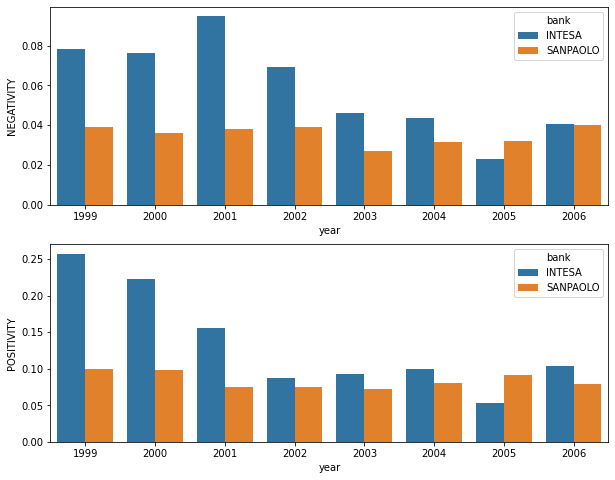

In [11]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['INTESA', 'SANPAOLO'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

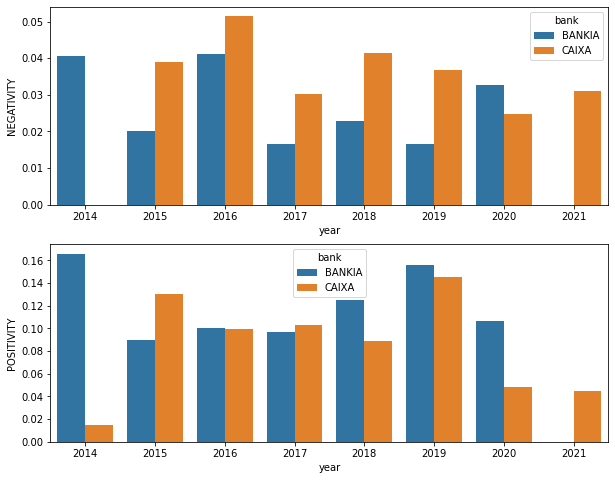

In [12]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['BANKIA', 'CAIXA'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

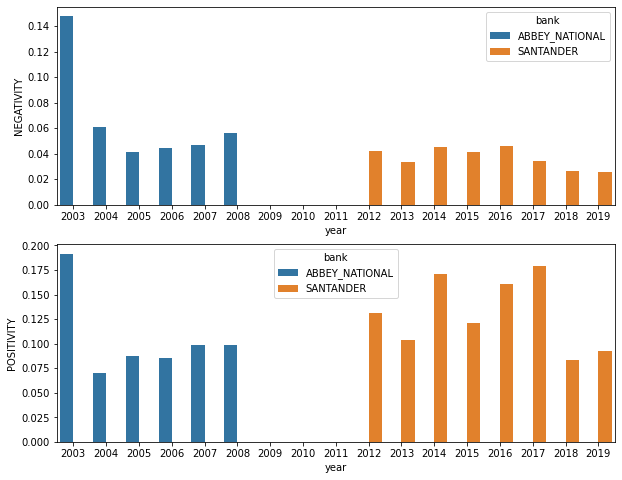

In [16]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['SANTANDER', 'ABBEY_NATIONAL'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

Añadir neutralidad:

In [17]:
df_props_counts

,bank,year,IS_NEG,IS_POS,TOTAL,NEGATIVITY,POSITIVITY
0,ABANCA,2014,1,2,2636,0.000379,0.000759
1,ABANCA,2015,1,3,2274,0.000440,0.001319
2,ABANCA,2016,46,149,2482,0.018533,0.060032
3,ABANCA,2017,48,135,5059,0.009488,0.026685
4,ABANCA,2018,50,148,2502,0.019984,0.059153
...,...,...,...,...,...,...,...
149,SANTANDER,2018,316,990,11853,0.026660,0.083523
150,SANTANDER,2019,272,979,10570,0.025733,0.092621
151,WGZ_BANK,2013,97,203,2037,0.047619,0.099656
152,WGZ_BANK,2014,93,219,2170,0.042857,0.100922


In [13]:
data

text  \
bank          year n_page n_phrase                                                      
DEUTSCHE_BANK 2009 82     106           The Group at a Glance \n1 We calculate thi...   
                          132           The Group at a Glance \n1 We calculate thi...   
                          127           The Group at a Glance \n1 We calculate thi...   
                          83            The Group at a Glance \n1 We calculate thi...   
                          142           The Group at a Glance \n1 We calculate thi...   
...                                                                               ...   
BBVA          2017 147    35        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          30        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          5         REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          13        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          21        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   

                                                                               phrase  \
bank          year n_page n_phrase                                                      
DEUTSCHE_BANK 2009 82     106        We calculate this adjusted measure of our ret...   
                          132       eholders equity to make it easier to compare u...   
                          127       adjusted measure as our Pretax return on avera...   
                          83         However this is not a measure of performance ...   
                          142       pare our ratio to other companies ratios witho...   
...                                                                               ...   
BBVA          2017 147    35        nothing has come to our attention that causes ...   
                          30        have not in all material respects been prepare...   
                          5          of the GRI Content Index including the reliab...   
                          13        In accordance with the terms of our engagement...   
                          21         Report and for no other purpose or in any other    

                                    length  negative   neutral  positive  
bank          year n_page n_phrase                                        
DEUTSCHE_BANK 2009 82     106           11  0.000079  0.999602  0.000320  
                          132           12  0.000639  0.853673  0.145688  
                          127           10  0.000098  0.998649  0.001253  
                          83            11  0.000096  0.999862  0.000042  
                          142           16  0.000071  0.999886  0.000043  
...                                    ...       ...       ...       ...  
BBVA          2017 147    35            12  0.000072  0.999716  0.000212  
                          30            14  0.000078  0.999879  0.000043  
                          5             10  0.000061  0.999896  0.000042  
                          13            14  0.000070  0.999888  0.000042  
                          21            10  0.000074  0.999884  0.000043  

[166049 rows x 6 columns]

## Word2Vec

In [28]:
SIZE_VECTORS = 500
WINDOW = 8
EPOCHS = 10
MIN_COUNT = 5

In [29]:
nlp = spacy.load("en_core_web_sm")

In [25]:
# from pandarallel import pandarallel
# 
# pandarallel.initialize(progress_bar=True, nb_workers=4)

INFO: Pandarallel will run on 4 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/
ERROR! Session/line number was not unique in database. History logging moved to new session 58


In [30]:
# data['texto_vector'] = data.phrase.progress_apply(lambda x: [w.lemma for w in nlp(x)])
data['texto_vector'] = data.phrase.progress_apply(lambda x: [w for w in x.split(' ')])

100%|██████████████████████████████████████████████████████████████████████| 424900/424900 [00:02<00:00, 189101.61it/s]


In [31]:
w2v = Word2Vec(data.texto_vector, vector_size=SIZE_VECTORS, window=WINDOW, epochs=EPOCHS, min_count=MIN_COUNT)

In [66]:
def palabra_en_modelo(palabra):
    try:
        w2v.wv.get_vector(palabra)
        return True
    except:
        return False

def vectorize_text(texto_vector):
    # Complete here the code
    vectors = [w2v.wv.get_vector(i) for i in texto_vector if palabra_en_modelo(i)]

    return np.mean(vectors, axis=0) if len(vectors) else np.empty(SIZE_VECTORS)

In [67]:
vectors = data.texto_vector.progress_apply(lambda x: vectorize_text(x)).to_numpy()

100%|███████████████████████████████████████████████████████████████████████| 424900/424900 [00:37<00:00, 11423.40it/s]


In [60]:
vectors[86002]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [82]:
for vec in vectors:
    if vec[0] == None:
        print(vec.shape)

In [86]:
dfVectors = pd.DataFrame(np.concatenate(vectors).reshape(vectors.shape[0],SIZE_VECTORS,), index=data.index, 
                         columns=[f'WV{i}' for i in range(SIZE_VECTORS)])

In [69]:
dfVectors.dropna()

WV0       WV1       WV2       WV3  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47       -0.138284 -0.408992 -0.044034 -0.264128   
                          41        0.231260 -0.438348 -0.075050 -0.440011   
                          26        0.193218 -0.194944  0.088656 -0.329297   
                          36        0.323662 -0.424762 -0.224718 -0.031756   
                          35       -0.041132 -0.316546 -0.464124 -0.140947   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        1.374812  0.223944 -0.113313  0.146142   
                          12        1.331187  0.341905  0.026072  0.091050   
                          4         1.102731  0.257781 -0.135899  0.112622   
                          1         1.095674  0.252252 -0.270701  0.099133   
                          15        1.401364  0.426036 -0.178492  0.125952   

                                         WV4       WV5       WV6       WV7  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47       -0.056958 -0.285081 -0.143011 -1.122351   
                          41       -0.080237 -0.452406  0.243002 -1.466291   
                          26        0.029093 -0.610924 -0.165808 -0.908560   
                          36       -0.008432 -0.835006 -0.367813 -0.451722   
                          35        0.223284 -0.649406 -0.125918 -0.547649   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        0.012112  0.671384  0.333467  0.231581   
                          12       -0.014744  0.689670  0.163798  0.347431   
                          4         0.271613  0.430100  0.176511  0.310034   
                          1         0.334670  0.327652  0.281957  0.395196   
                          15        0.289901  0.557983 -0.176844  0.613593   

                                         WV8       WV9  ...     WV490  \
bank          year n_page n_phrase                      ...             
DEUTSCHE_BANK 2009 82     47       -0.261510 -0.942789  ... -0.481212   
                          41        0.005896 -0.815642  ... -0.581155   
                          26       -0.413241 -0.892143  ... -0.135603   
                          36       -0.099588 -0.734968  ... -0.256231   
                          35       -0.602908 -1.203496  ... -0.524683   
...                                      ...       ...  ...       ...   
ABANCA        2014 275    14       -0.137554 -0.487337  ...  0.664975   
                          12        0.000189 -0.388782  ...  0.375041   
                          4        -0.065218 -0.458926  ...  0.405013   
                          1        -0.034340 -0.279436  ...  0.663070   
                          15        0.008340 -0.599898  ...  0.207721   

                                       WV491     WV492     WV493     WV494  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47        0.667806  0.226979  0.272194  0.256940   
                          41        1.024929  0.043602  0.350376  0.418103   
                          26        0.848973 -0.035115  0.344931  0.384467   
                          36        1.019621 -0.122805  0.784370  0.278382   
                          35        0.330395  0.129992  0.134529  0.085086   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        0.069430  0.108462 -0.424354  0.119817   
                          12        0.410776  0.034482 -0.325025 -0.077006   
                          4         0.060730  0.161907 -0.344338  0.064110   
                          1        -0.108712  0.060502 -0.521759  0.164761   
                          15        0.446043  0.404532 -0.241833  0.183797   

                                       WV495  

In [88]:
dfVectors

WV0       WV1       WV2       WV3  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47       -0.138284 -0.408992 -0.044034 -0.264128   
                          41        0.231260 -0.438348 -0.075050 -0.440011   
                          26        0.193218 -0.194944  0.088656 -0.329297   
                          36        0.323662 -0.424762 -0.224718 -0.031756   
                          35       -0.041132 -0.316546 -0.464124 -0.140947   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        1.374812  0.223944 -0.113313  0.146142   
                          12        1.331187  0.341905  0.026072  0.091050   
                          4         1.102731  0.257781 -0.135899  0.112622   
                          1         1.095674  0.252252 -0.270701  0.099133   
                          15        1.401364  0.426036 -0.178492  0.125952   

                                         WV4       WV5       WV6       WV7  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47       -0.056958 -0.285081 -0.143011 -1.122351   
                          41       -0.080237 -0.452406  0.243002 -1.466291   
                          26        0.029093 -0.610924 -0.165808 -0.908560   
                          36       -0.008432 -0.835006 -0.367813 -0.451722   
                          35        0.223284 -0.649406 -0.125918 -0.547649   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        0.012112  0.671384  0.333467  0.231581   
                          12       -0.014744  0.689670  0.163798  0.347431   
                          4         0.271613  0.430100  0.176511  0.310034   
                          1         0.334670  0.327652  0.281957  0.395196   
                          15        0.289901  0.557983 -0.176844  0.613593   

                                         WV8       WV9  ...     WV490  \
bank          year n_page n_phrase                      ...             
DEUTSCHE_BANK 2009 82     47       -0.261510 -0.942789  ... -0.481212   
                          41        0.005896 -0.815642  ... -0.581155   
                          26       -0.413241 -0.892143  ... -0.135603   
                          36       -0.099588 -0.734968  ... -0.256231   
                          35       -0.602908 -1.203496  ... -0.524683   
...                                      ...       ...  ...       ...   
ABANCA        2014 275    14       -0.137554 -0.487337  ...  0.664975   
                          12        0.000189 -0.388782  ...  0.375041   
                          4        -0.065218 -0.458926  ...  0.405013   
                          1        -0.034340 -0.279436  ...  0.663070   
                          15        0.008340 -0.599898  ...  0.207721   

                                       WV491     WV492     WV493     WV494  \
bank          year n_page n_phrase                                           
DEUTSCHE_BANK 2009 82     47        0.667806  0.226979  0.272194  0.256940   
                          41        1.024929  0.043602  0.350376  0.418103   
                          26        0.848973 -0.035115  0.344931  0.384467   
                          36        1.019621 -0.122805  0.784370  0.278382   
                          35        0.330395  0.129992  0.134529  0.085086   
...                                      ...       ...       ...       ...   
ABANCA        2014 275    14        0.069430  0.108462 -0.424354  0.119817   
                          12        0.410776  0.034482 -0.325025 -0.077006   
                          4         0.060730  0.161907 -0.344338  0.064110   
                          1        -0.108712  0.060502 -0.521759  0.164761   
                          15        0.446043  0.404532 -0.241833  0.183797   

                                       WV495  

In [92]:
dfVectors.to_numpy().min()

-429.6926879964353

## Autoencoding:

In [186]:
import wandb
from wandb.keras import WandbCallback

wandb.init(project="nlp-bank-tfg", entity="juansbg")

binary_crossentropy,█▄▃▃▂▂▂▂▁▁▁▁▁▁
epoch,▁▂▂▃▃▄▄▅▅▆▆▇▇█
loss,█▄▃▃▂▂▂▂▁▁▁▁▁▁
mae,█▄▃▃▂▂▂▂▁▁▁▁▁▁
binary_crossentropy,-2.02432
epoch,13
loss,0.02831
mae,0.1272


In [187]:
input_layer = tf.keras.layers.Input(shape=(500,),)

x = tf.keras.layers.Dense(400, activation='tanh')(input_layer)
x = tf.keras.layers.Dense(300, activation='tanh')(x)
x = tf.keras.layers.Dropout(.1, )(x)
x = tf.keras.layers.Dense(200, activation='tanh')(x)
x = tf.keras.layers.Dropout(.1, )(x)
x = tf.keras.layers.Dense(150, activation='tanh')(x)
x = tf.keras.layers.Dropout(.06,)(x)
x = tf.keras.layers.Dense(100, activation='tanh')(x)
x = tf.keras.layers.Dense(50, activation='sigmoid')(x)

encoder = tf.keras.Model(inputs=input_layer, outputs=x)

In [188]:
input_layer = tf.keras.layers.Input(shape=(50,),)

x = tf.keras.layers.Dense(100, activation='tanh')(input_layer)
x = tf.keras.layers.Dense(150, activation='tanh')(x)
x = tf.keras.layers.Dense(200, activation='tanh')(x)
x = tf.keras.layers.Dense(300, activation='tanh')(x)
x = tf.keras.layers.Dense(400, activation='tanh')(x)
x = tf.keras.layers.Dense(500,)(x)

decoder = tf.keras.Model(inputs=input_layer, outputs=x)

In [189]:
input_layer = tf.keras.layers.Input(shape=(500,),)

x = encoder(input_layer)
x = decoder(x)

autoencoder = tf.keras.Model(inputs=input_layer, outputs=x)

In [190]:
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss='mse', metrics=['mae','binary_crossentropy'])

In [191]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10),
    WandbCallback()
]

In [192]:
X = dfVectors.to_numpy()

In [193]:
autoencoder.fit(
    X, X, epochs=1000, callbacks=callbacks, 
)

Epoch 1/1000
13279/13279 [==============================] - 84s 6ms/step - loss: 0.0352 - mae: 0.1426 - binary_crossentropy: -1.9685 - _timestamp: 1649172071.0000 - _runtime: 108.0000
Epoch 2/1000
13279/13279 [==============================] - 83s 6ms/step - loss: 0.0313 - mae: 0.1344 - binary_crossentropy: -2.0001 - _timestamp: 1649172153.0000 - _runtime: 190.0000
Epoch 3/1000
13279/13279 [==============================] - 82s 6ms/step - loss: 0.0306 - mae: 0.1326 - binary_crossentropy: -2.0060 - _timestamp: 1649172235.0000 - _runtime: 272.0000
Epoch 4/1000
13279/13279 [==============================] - 85s 6ms/step - loss: 0.0300 - mae: 0.1314 - binary_crossentropy: -2.0104 - _timestamp: 1649172320.0000 - _runtime: 357.0000
Epoch 5/1000
13279/13279 [==============================] - 84s 6ms/step - loss: 0.0297 - mae: 0.1304 - binary_crossentropy: -2.0134 - _timestamp: 1649172405.0000 - _runtime: 442.0000
Epoch 6/1000
13279/13279 [==============================] - 83s 6ms/step - loss:

In [194]:
encoder = autoencoder.layers[1]

In [195]:
encoded = encoder.predict(X)

In [196]:
sentiment_phrases = pd.DataFrame(encoded, index=dfVectors.index).join(data[['negative','positive']])

In [197]:
threshold = .5
sentiment_phrases = sentiment_phrases[
    (sentiment_phrases.negative >= threshold) | 
    (sentiment_phrases.positive >= threshold)
].drop(columns=['negative','positive'])

In [177]:
X_embedded = TSNE(n_components=2, 
                  learning_rate='auto', 
                  init='pca', verbose=1,
                  #n_iter=10000
                 ).fit_transform(sentiment_phrases)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 63364 samples in 0.003s...
[t-SNE] Computed neighbors for 63364 samples in 79.354s...
[t-SNE] Computed conditional probabilities for sample 1000 / 63364
[t-SNE] Computed conditional probabilities for sample 2000 / 63364
[t-SNE] Computed conditional probabilities for sample 3000 / 63364
[t-SNE] Computed conditional probabilities for sample 4000 / 63364
[t-SNE] Computed conditional probabilities for sample 5000 / 63364
[t-SNE] Computed conditional probabilities for sample 6000 / 63364
[t-SNE] Computed conditional probabilities for sample 7000 / 63364
[t-SNE] Computed conditional probabilities for sample 8000 / 63364
[t-SNE] Computed conditional probabilities for sample 9000 / 63364
[t-SNE] Computed conditional probabilities for sample 10000 / 63364
[t-SNE] Computed conditional probabilities for sample 11000 / 63364
[t-SNE] Computed conditional probabilities for sample 12000 / 63364
[t-SNE] Computed conditional probabilities for sa

C:\Users\juans\miniconda3\envs\nlp-3-8\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 114.885025
[t-SNE] KL divergence after 1000 iterations: 3.838078


In [179]:
X_embedded_df = pd.DataFrame(X_embedded, columns=['C1','C2'], index=sentiment_phrases.index).reset_index()

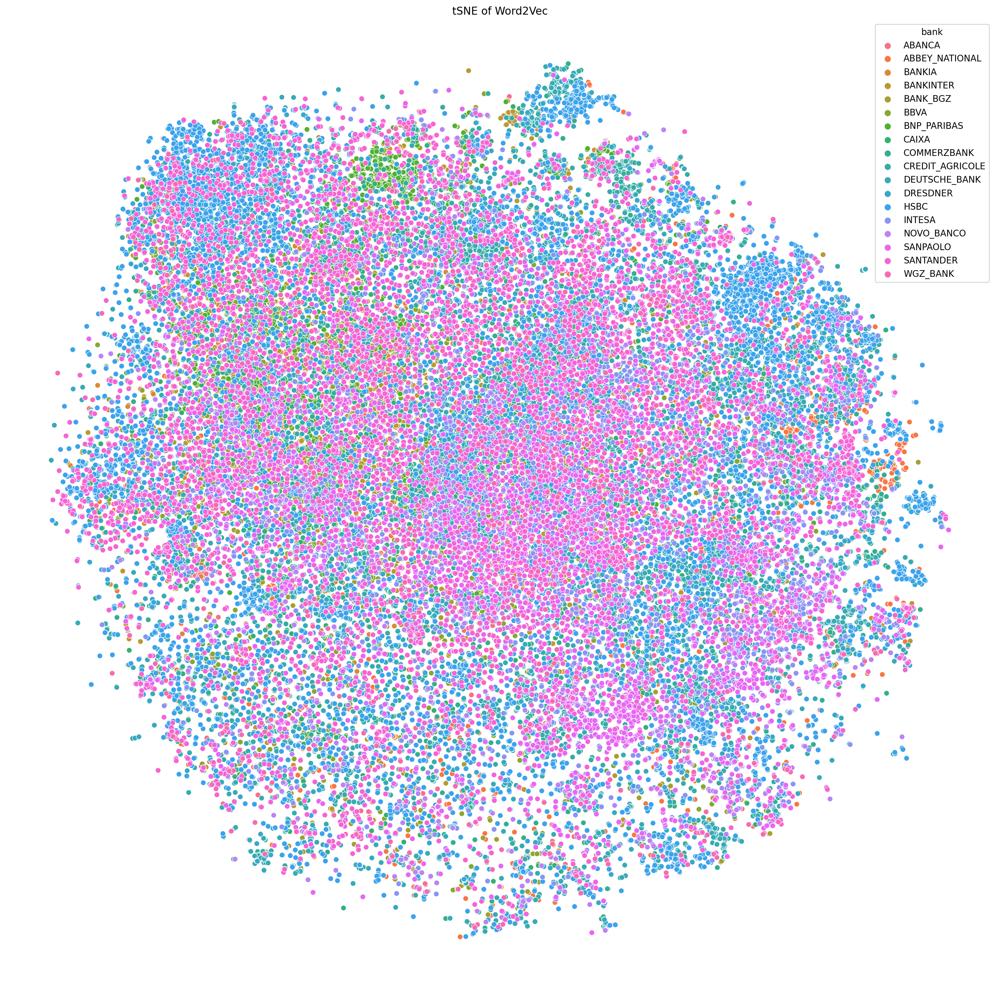

In [180]:
fig, ax = plt.subplots(figsize=(20,20), dpi=200)
sns.scatterplot(data=X_embedded_df, x='C1', y='C2', hue='bank', ax=ax)
ax.set_title('tSNE of Word2Vec')
ax.axis('off')
plt.show()

In [182]:
X_embedded_df = pd.DataFrame(X_embedded, columns=['C1','C2'], index=sentiment_phrases.index).join(data[['negative','positive']])

In [183]:
X_embedded_df['sentiment'] = 0
X_embedded_df['sentiment'] = X_embedded_df['sentiment'] + X_embedded_df['positive'] - X_embedded_df['negative']

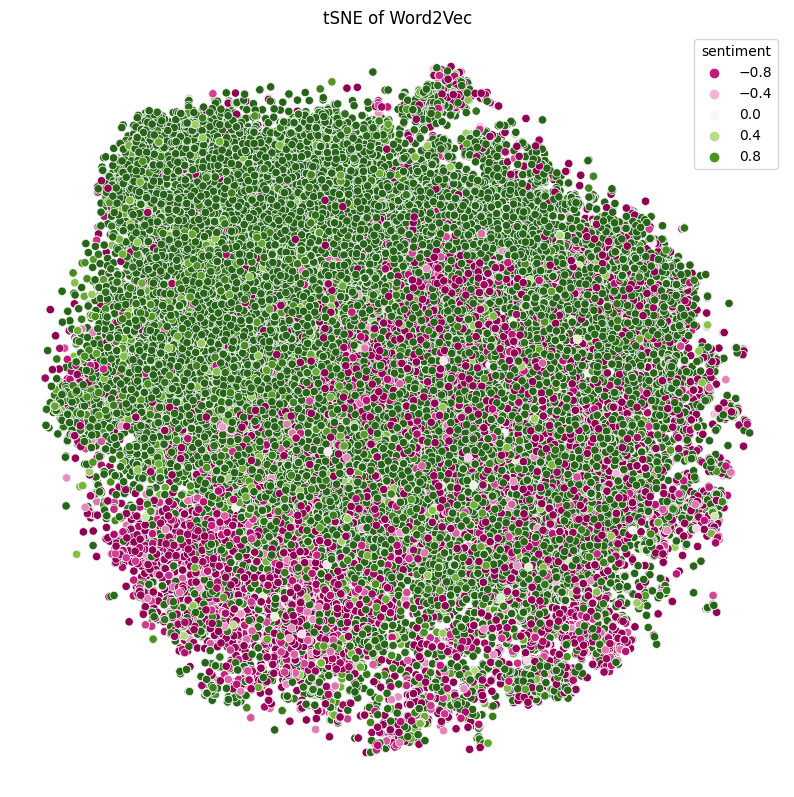

In [185]:
fig, ax = plt.subplots(figsize=(10,10), dpi=100)
sns.scatterplot(data=X_embedded_df, x='C1', y='C2', hue='sentiment', palette='PiYG', ax=ax)
ax.set_title('tSNE of Word2Vec')
ax.axis('off')
plt.show()

In [200]:
pca = PCA(n_components=4)

df_pca = pd.DataFrame(pca.fit_transform(sentiment_phrases), columns=['PC1','PC2','PC3','PC4'], index=sentiment_phrases.index).reset_index()

In [201]:
df_pca

,bank,year,n_page,n_phrase,PC1,PC2,PC3,PC4
0,ABANCA,2014,61,16,-0.013787,0.041881,0.013231,0.058963
1,ABANCA,2014,81,40,-0.008343,0.026534,0.028587,0.060595
2,ABANCA,2014,170,21,-0.012114,0.038851,0.009702,0.069137
3,ABANCA,2015,22,29,-0.014338,0.044487,0.014223,0.059254
4,ABANCA,2015,43,8,0.005760,0.034102,-0.005727,0.043359
...,...,...,...,...,...,...,...,...
63359,WGZ_BANK,2015,262,12,0.003685,-0.042626,0.027228,0.018023
63360,WGZ_BANK,2015,262,43,0.022454,-0.009579,0.028543,-0.024094
63361,WGZ_BANK,2015,264,6,0.003695,-0.011702,0.024804,0.005410
63362,WGZ_BANK,2015,264,8,-0.012579,-0.010126,0.010786,0.049784


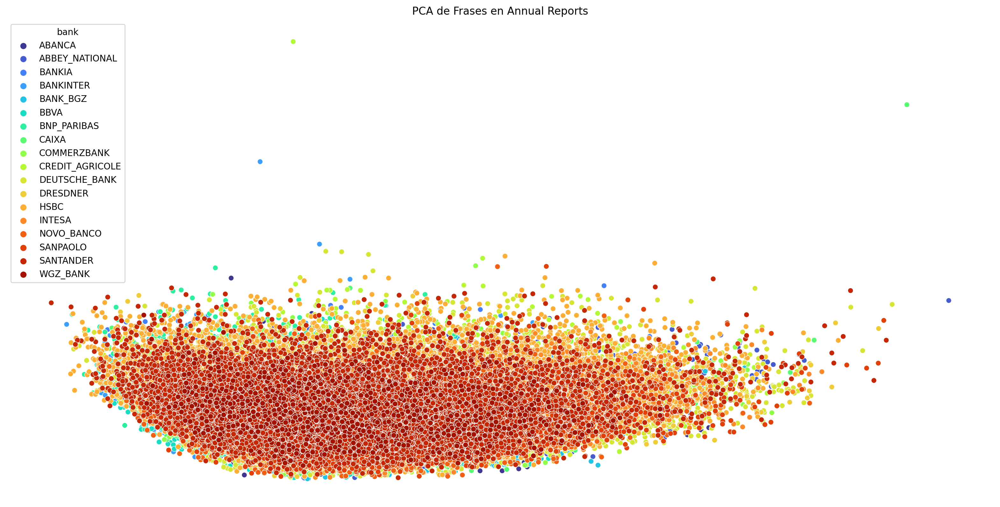

In [202]:
fig, ax = plt.subplots(figsize=(20,10), ncols=1, dpi=200)
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='bank', palette='turbo', alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

In [204]:
df_pca_sentiment = pd.DataFrame(pca.transform(sentiment_phrases), 
                                columns=['PC1','PC2','PC3','PC4'], 
                                index=sentiment_phrases.index).join(data[['negative','positive']])

In [205]:
df_pca_sentiment['sentiment'] = 0
df_pca_sentiment['sentiment'] = df_pca_sentiment['sentiment'] + df_pca_sentiment['positive'] - df_pca_sentiment['negative']

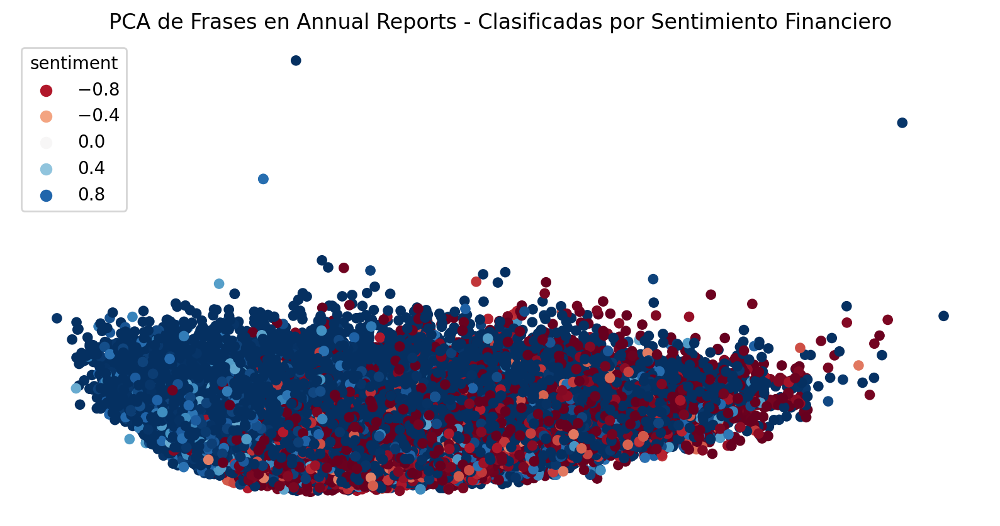

In [206]:
fig, ax = plt.subplots(figsize=(10,5), ncols=1, dpi=200)
sns.scatterplot(data=df_pca_sentiment[(df_pca_sentiment.sentiment >= .5) | (df_pca_sentiment.sentiment <= -.5)], 
                x='PC1', y='PC2', hue='sentiment', palette='RdBu', linewidth=0, alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports - Clasificadas por Sentimiento Financiero')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

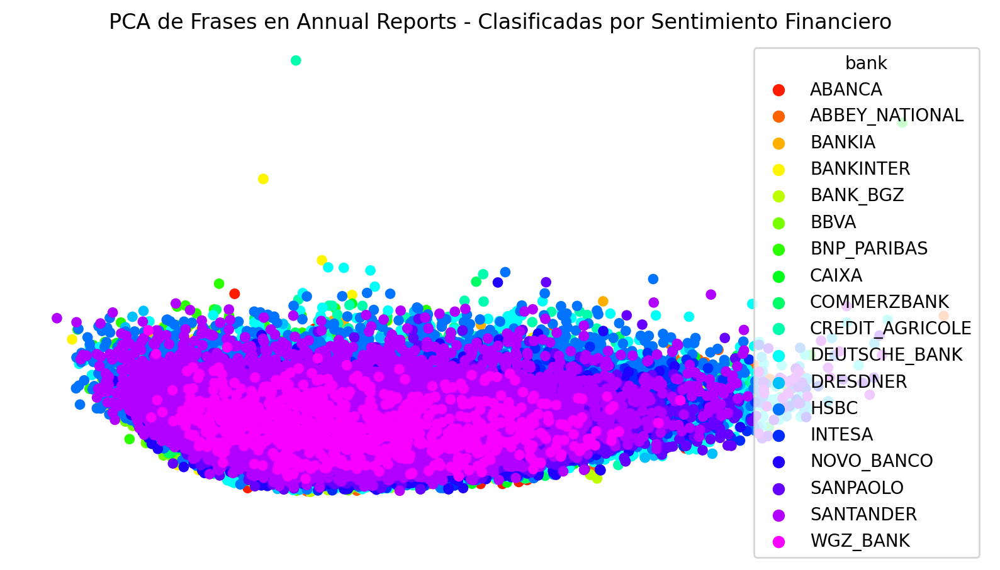

In [207]:
fig, ax = plt.subplots(figsize=(10,5), ncols=1, dpi=200)
sns.scatterplot(data=df_pca_sentiment[(df_pca_sentiment.sentiment >= .5) | (df_pca_sentiment.sentiment <= -.5)], 
                x='PC1', y='PC2', hue='bank', palette='gist_rainbow', linewidth=0, alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports - Clasificadas por Sentimiento Financiero')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

In [208]:
df_pca_sentiment[(df_pca_sentiment.sentiment >= .4) | (df_pca_sentiment.sentiment <= -.4)]

PC1       PC2       PC3       PC4  \
bank     year n_page n_phrase                                           
ABANCA   2014 61     16       -0.013787  0.041881  0.013228  0.058944   
              81     40       -0.008343  0.026533  0.028584  0.060580   
              170    21       -0.012114  0.038851  0.009699  0.069118   
         2015 22     29       -0.014338  0.044487  0.014219  0.059233   
              43     8         0.005760  0.034102 -0.005729  0.043344   
...                                 ...       ...       ...       ...   
WGZ_BANK 2015 262    12        0.003685 -0.042626  0.027230  0.018024   
                     43        0.022454 -0.009579  0.028544 -0.024101   
              264    6         0.003695 -0.011702  0.024803  0.005400   
                     8        -0.012579 -0.010125  0.010789  0.049780   
              274    29        0.066421 -0.010167  0.064254 -0.012754   

                               negative  positive  sentiment  
bank     year n_page n_phrase                                 
ABANCA   2014 61     16        0.001180  0.826349   0.825169  
              81     40        0.959789  0.000756  -0.959033  
              170    21        0.000926  0.995606   0.994681  
         2015 22     29        0.000594  0.971773   0.971179  
              43     8         0.561060  0.003696  -0.557364  
...                                 ...       ...        ...  
WGZ_BANK 2015 262    12        0.000430  0.996309   0.995878  
                     43        0.903546  0.095970  -0.807576  
              264    6         0.000469  0.877470   0.877001  
                     8         0.001562  0.812694   0.811132  
              274    29        0.960591  0.000639  -0.959952  

[63471 rows x 7 columns]

In [168]:
# w2v.wv.most_similar('equity', topn=20)

In [209]:
nlp('acquisitions')[0].lemma_

'acquisition'

In [169]:
# w2v.wv.index_to_key